<a href="https://colab.research.google.com/github/spandanbhandari/WGAN/blob/main/WGAN_for_face_creation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q torchvision
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import matplotlib.pyplot as plt
import numpy as np
import os

In [ ]:
from google.colab import files
files.upload()  # upload kaggle.json here


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"spandanbhandari","key":"6b2e3285f89a1660e0775e2815bcd960"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d splcher/animefacedataset
!unzip -q animefacedataset.zip -d ./data/anime_faces/


Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
animefacedataset.zip: Skipping, found more recently modified local copy (use --force to force download)
replace ./data/anime_faces/images/0_2000.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace ./data/anime_faces/images/10000_2004.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace ./data/anime_faces/images/10000_2004.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
A


In [ ]:
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)  # Normalize to [-1, 1]
])

dataset = ImageFolder(root='./data/anime_faces/', transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)


In [ ]:
import torch.nn as nn
class Generator(nn.Module):
  def __init__(self,z_dim=100,img_channels=3,features=64):
    super().__init__()
    self.gen=nn.Sequential(
        self._block(z_dim,features*8,4,1,0), #4x4
        self._block(features*8,features*4,4,2,1),#8x8
        self._block(features*4,features*2,4,2,1),#16x16
        self._block(features*2,features,4,2,1),#32x32
        nn.ConvTranspose2d(features,img_channels,4,2,1),#64x64
        nn.Tanh()
    )
  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride,padding,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(True)
    )
  def forward(self,x):
    return self.gen(x)

class Critic(nn.Module):
  def __init__(self,img_channels=3,features=64):
    super().__init__()
    self.critic=nn.Sequential(
        self._block(img_channels,features,4,2,1),
        self._block(features,features*2,4,2,1),
        self._block(features*2,features*4,4,2,1),
        self._block(features*4,features*8,4,2,1),
        nn.Conv2d(features*8,1,4,2,0)
    )
  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride,padding,bias=False),
        nn.InstanceNorm2d(out_channels,affine=True),
        nn.LeakyReLU(0.2,inplace=True)
    )
  def forward(self,x):
    return self.critic(x).view(-1)

In [ ]:
def gradient_penalty(critic,real,fake,device="cuda"):
  pass
def initialize_weights(model):
  for m in model.modules():
    if isinstance(m,(nn.Conv2d,nn.ConvTranspose2d,nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data,0.0,0.02)

Epoch[0/50] Loss D:-1.4922,loss G:0.6901


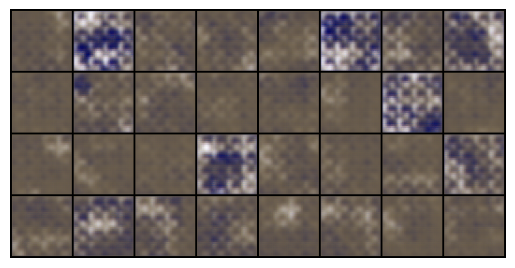

Epoch[1/50] Loss D:-1.4598,loss G:0.6819


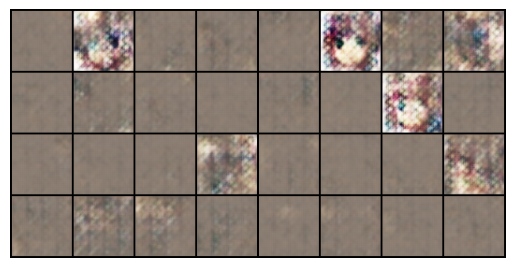

Epoch[2/50] Loss D:-1.0209,loss G:0.6275


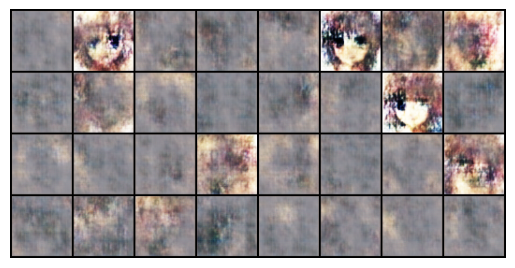

Epoch[3/50] Loss D:-1.3645,loss G:0.6576


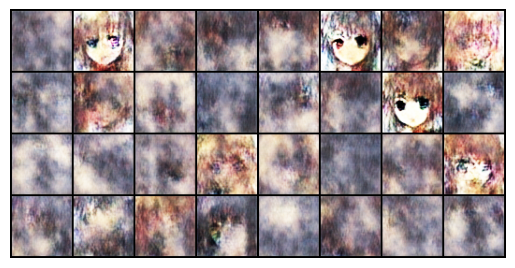

Epoch[4/50] Loss D:-1.2781,loss G:0.6527


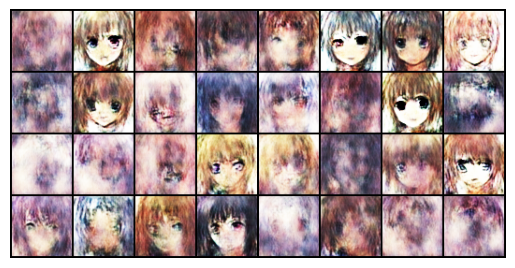

Epoch[5/50] Loss D:-1.2297,loss G:0.5825


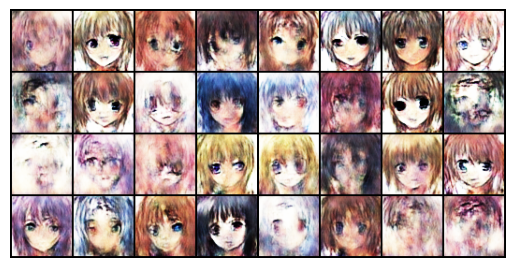

Epoch[6/50] Loss D:-0.9615,loss G:0.4100


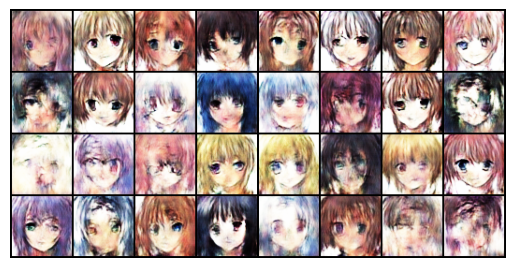

Epoch[7/50] Loss D:-1.1570,loss G:0.5827


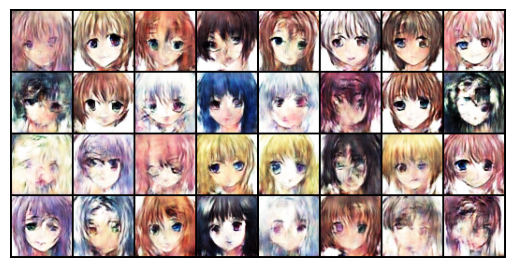

Epoch[8/50] Loss D:-0.9907,loss G:0.5805


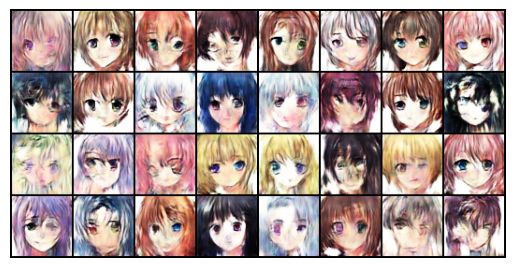

Epoch[9/50] Loss D:-0.9859,loss G:0.4148


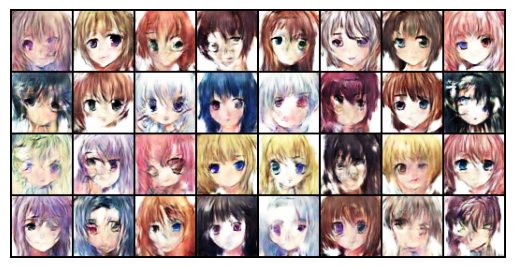

Epoch[10/50] Loss D:-0.9372,loss G:0.4445


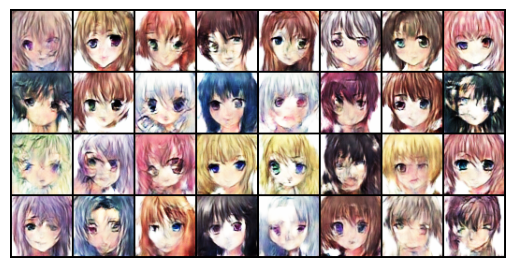

Epoch[11/50] Loss D:-0.8963,loss G:0.5333


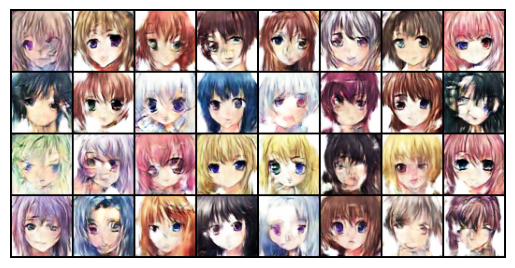

Epoch[12/50] Loss D:-0.9239,loss G:0.5088


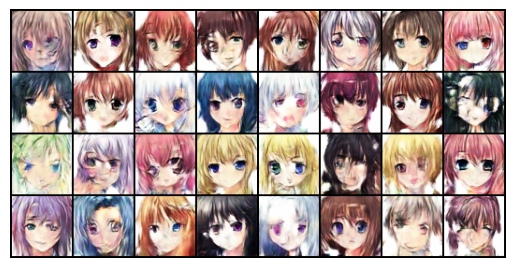

Epoch[13/50] Loss D:-0.8290,loss G:0.5035


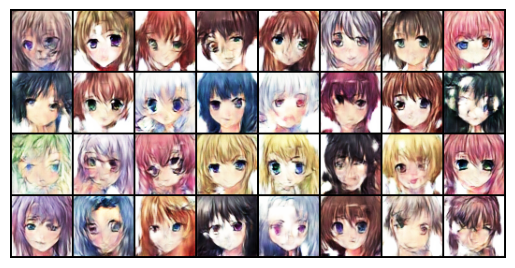

Epoch[14/50] Loss D:-0.7272,loss G:0.1309


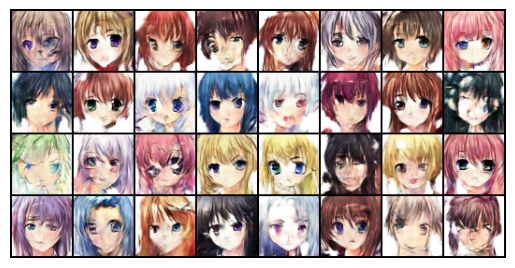

Epoch[15/50] Loss D:-0.8666,loss G:0.4714


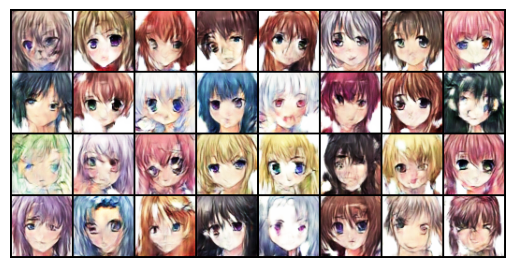

Epoch[16/50] Loss D:-0.8003,loss G:0.5471


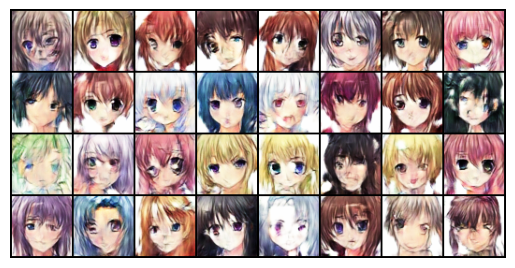

Epoch[17/50] Loss D:-0.8107,loss G:0.3426


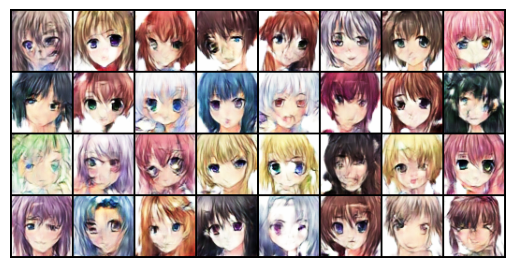

Epoch[18/50] Loss D:-0.7260,loss G:0.4541


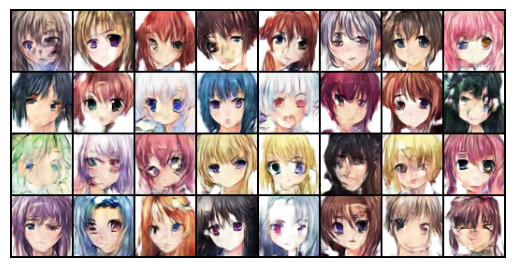

Epoch[19/50] Loss D:-0.7778,loss G:0.2539


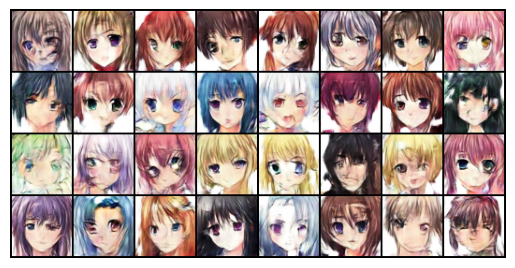

Epoch[20/50] Loss D:-0.7839,loss G:0.2423


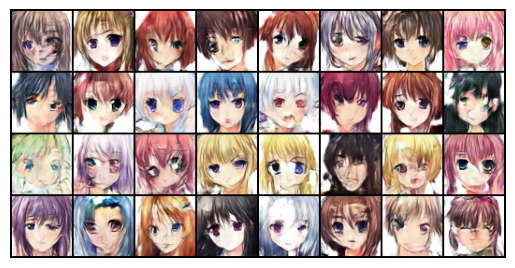

Epoch[21/50] Loss D:-0.8024,loss G:0.4975


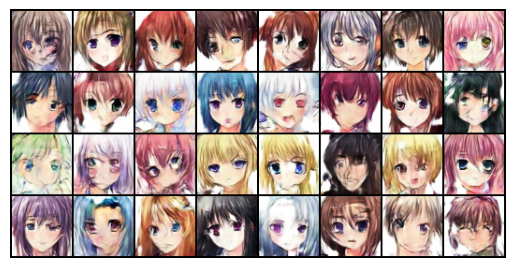

Epoch[22/50] Loss D:-0.7814,loss G:0.4038


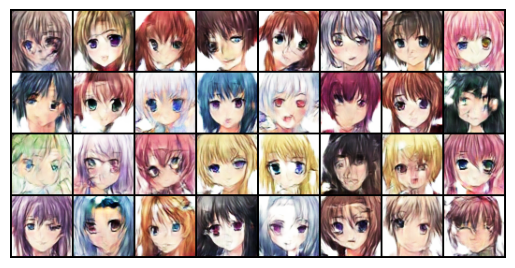

Epoch[23/50] Loss D:-0.6655,loss G:0.5292


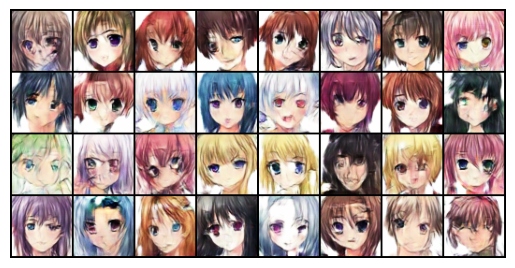

Epoch[24/50] Loss D:-0.6824,loss G:0.5118


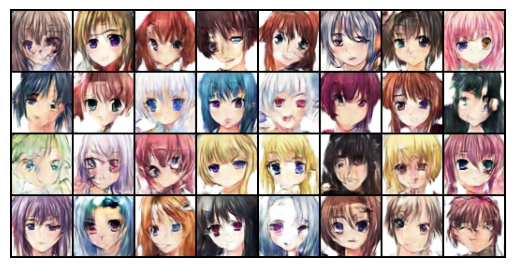

Epoch[25/50] Loss D:-0.9336,loss G:0.3733


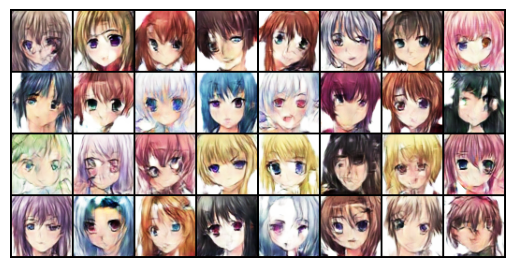

Epoch[26/50] Loss D:-0.7342,loss G:0.5110


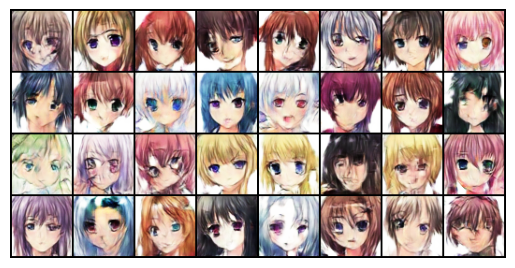

Epoch[27/50] Loss D:-0.8264,loss G:0.4815


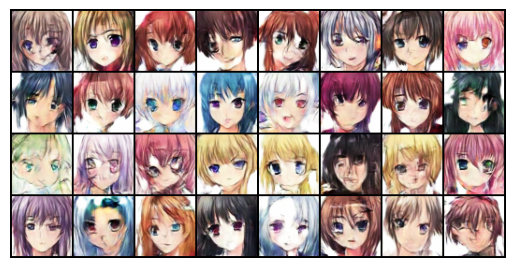

Epoch[28/50] Loss D:-0.7239,loss G:0.3912


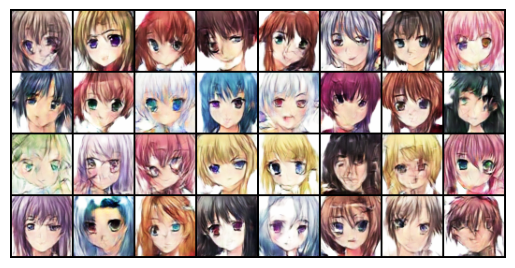

In [ ]:
device="cuda" if torch.cuda.is_available() else "cpu"
z_dim=100
lr=5e-5
n_epochs=50
critic_iter=5
weight_clip=0.01

gen=Generator(z_dim).to(device)
critic=Critic().to(device)
initialize_weights(gen)
initialize_weights(critic)

opt_gen=torch.optim.RMSprop(gen.parameters(),lr=lr)
opt_critic=torch.optim.RMSprop(critic.parameters(),lr=lr)

fixed_noise=torch.randn(32,z_dim,1,1).to(device)

for epoch in range(n_epochs):
  for batch_idx,(real,_) in enumerate(dataloader):
    real=real.to(device)
    cur_batch_size=real.size(0)
    for _ in range(critic_iter):
      noise=torch.randn(cur_batch_size,z_dim,1,1).to(device)
      fake=gen(noise)
      critic_real=critic(real).mean()
      critic_fake=critic(fake.detach()).mean()
      loss_critic=-(critic_real-critic_fake)

      opt_critic.zero_grad()
      loss_critic.backward()
      opt_critic.step()

      #weight clipping
      for p in critic.parameters():
        p.data.clamp_(-weight_clip,weight_clip)

    #generator update
    noise=torch.randn(cur_batch_size,z_dim,1,1).to(device)
    fake=gen(noise)
    loss_gen=-critic(fake).mean()

    opt_gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()


  print(f"Epoch[{epoch}/{n_epochs}] Loss D:{loss_critic:.4f},loss G:{loss_gen:.4f}")
  with torch.no_grad():
    fake=gen(fixed_noise)
    img_grid=torchvision.utils.make_grid(fake,normalize=True)
    plt.imshow(np.transpose(img_grid.cpu(),(1,2,0)))
    plt.axis('off')
    plt.show()

In [ ]:
torch.save(gen.state_dict(), "generator.pth")
torch.save(critic.state_dict(), "critic.pth")
